# Machine Learning Track: B2B Invoice Management Application
## MILESTONES 1,2 and 3

# MILESTONE 1: DATA CLEANING AND PREPROCESSING 

## BASIC

### Importing needful libraries and reading the data

In [136]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

In [137]:
data = pd.read_csv('Datasets/H2HBABBA1062.csv')

### Examining the data

In [138]:
data.shape

(50000, 19)

In [139]:
data.head(5)

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
0,U001,0200743123,KROGER corp,2019-01-28 00:00:00,2019.0,1.928613e+09,2019-01-12,20190112,20190112,20190127.0,USD,RV,1.0,NaN,2646.76,20190112.0,NAA8,1.928613e+09,0
1,U001,0200555117,BURR in,NaN,2020.0,1.930732e+09,2020-04-02,20200402,20200402,20200417.0,USD,RV,1.0,NaN,63459.53,20200402.0,NAA8,1.930732e+09,1
2,U001,0200792734,MDV/ us,2019-01-22 00:00:00,2019.0,1.928583e+09,2019-01-07,20190107,20190107,20190122.0,USD,RV,1.0,NaN,113490.94,20190107.0,NAA8,1.928583e+09,0
3,U001,0200749782,KROG corp,2019-05-28 00:00:00,2019.0,1.929289e+09,2019-05-11,20190510,20190511,20190526.0,USD,RV,1.0,NaN,44355.37,20190511.0,NAA8,1.929289e+09,0
4,U001,0200749782,KROG us,2019-07-08 00:00:00,2019.0,1.929532e+09,2019-06-22,20190622,20190622,20190707.0,USD,RV,1.0,NaN,2382.56,20190622.0,NAA8,1.929532e+09,0


In [140]:
data.tail(5)

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
49995,U001,0200706844,WINC us,NaN,2020.0,1.930716e+09,2020-03-29,20200328,20200329,20200413.0,USD,RV,1.0,NaN,30575.96,20200329.0,NAA8,1.930716e+09,1
49996,U001,0200331749,SYSC in,2019-04-01 00:00:00,2019.0,1.928960e+09,2019-03-14,20190314,20190314,20190329.0,USD,RV,1.0,NaN,22158.08,20190314.0,NAA8,1.928960e+09,0
49997,U001,0200726979,BJ'S associates,NaN,2020.0,1.930637e+09,2020-03-09,20200311,20200309,20200324.0,USD,RV,1.0,NaN,433.38,20200309.0,NAA8,1.930637e+09,1
49998,U001,0200769623,WAL-MAR corp,2019-09-23 00:00:00,2019.0,1.929857e+09,2019-09-11,20190910,20190911,20190926.0,USD,RV,1.0,NaN,1897.50,20190911.0,NAH4,1.929857e+09,0
49999,U001,0200729942,SA trust,NaN,2020.0,1.930614e+09,2020-03-06,20200306,20200306,20200321.0,USD,RV,1.0,NaN,22601.08,20200306.0,NAA8,1.930614e+09,1


In [141]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   business_code           50000 non-null  object 
 1   cust_number             50000 non-null  object 
 2   name_customer           50000 non-null  object 
 3   clear_date              40000 non-null  object 
 4   buisness_year           50000 non-null  float64
 5   doc_id                  50000 non-null  float64
 6   posting_date            50000 non-null  object 
 7   document_create_date    50000 non-null  int64  
 8   document_create_date.1  50000 non-null  int64  
 9   due_in_date             50000 non-null  float64
 10  invoice_currency        50000 non-null  object 
 11  document type           50000 non-null  object 
 12  posting_id              50000 non-null  float64
 13  area_business           0 non-null      float64
 14  total_open_amount       50000 non-null

### Observation1: 

1. Most of the dates column are either `object dtype` or `float/int dtype`, would need conversion.
2. area_business contains all NaN values, `MUST` be dropped.
3. clear_date contains most of the null values, after area_business.
4. invoice_id contains `2 NaN values, 0.004%` could drop those 2 rows after analysing more.
5. invoice_currency, posting_id and document type seems constant for now.

## PREPROCESSING THE DATA

### Splitting in main train and test data

In [142]:
data_train = data[data.clear_date.notna()]
data_test = data[data.clear_date.isna()]

### Converting date columns to datetime columns

In [143]:
import datetime
data_train['clear_date']= pd.to_datetime(data_train['clear_date'])
data_train['due_in_date'] = pd.to_datetime(data_train['due_in_date'], format='%Y%m%d')
data_train['document_create_date'] = pd.to_datetime(data_train['document_create_date'], format='%Y%m%d')
data_train['document_create_date.1'] = pd.to_datetime(data_train['document_create_date.1'], format='%Y%m%d')
data_train['baseline_create_date'] = pd.to_datetime(data_train['baseline_create_date'], format='%Y%m%d')
data_train['posting_date'] = pd.to_datetime(data_train['posting_date'], format='%Y-%m-%d')
data_train.dtypes

business_code                     object
cust_number                       object
name_customer                     object
clear_date                datetime64[ns]
buisness_year                    float64
doc_id                           float64
posting_date              datetime64[ns]
document_create_date      datetime64[ns]
document_create_date.1    datetime64[ns]
due_in_date               datetime64[ns]
invoice_currency                  object
document type                     object
posting_id                       float64
area_business                    float64
total_open_amount                float64
baseline_create_date      datetime64[ns]
cust_payment_terms                object
invoice_id                       float64
isOpen                             int64
dtype: object

In [144]:
# small observation made from seeing the data thoroughly:

In [145]:
data_train[['posting_date','document_create_date.1','baseline_create_date']]

,posting_date,document_create_date.1,baseline_create_date
0,2019-01-12,2019-01-12,2019-01-12
2,2019-01-07,2019-01-07,2019-01-07
3,2019-05-11,2019-05-11,2019-05-11
4,2019-06-22,2019-06-22,2019-06-22
5,2019-04-08,2019-04-08,2019-04-08
...,...,...,...
49992,2019-03-23,2019-03-23,2019-03-23
49993,2019-04-09,2019-04-09,2019-04-09
49994,2019-10-10,2019-10-10,2019-10-10
49996,2019-03-14,2019-03-14,2019-03-14


In [146]:
comparison_column1 = pd.Series(np.where(data_train["posting_date"] == data_train["baseline_create_date"], True, False))
comparison_column1.value_counts() #88.8% match

True     35547
False     4453
dtype: int64

In [147]:
comparison_column2 = pd.Series(np.where(data_train["posting_date"] == data_train["document_create_date.1"], True, False))
comparison_column2.value_counts() #99.9% match

True     39998
False        2
dtype: int64

### Observation 2:

SOME TERMS DEFINITIONS (REFERRING TO PRS AND GOOGLE):                                                                                      
`Baseline_create_date`: the date on which the invoice was created, turns out this date is used to create due date, since for obvious reasons,this date has approx `89% of SIMILARITY with posting_date`. Also note that the other rows which are NOT equal to it differs from just 1 day. Thus considering the above analysis, I am deciding to discard this column (`will remove in removing unique column section`).                                                     
`Document_create_date`: the date on which the invoice document was created, turns out it is contains almost same data as posting_date (`after removal of NaN values, as seen later`), thus making it unnecessary to keep this feature as column (`will remove in removing duplicates column`).

1. Target variable in our dataset is `clear_date - due_in_date` (Mentioned that we need to predict clear_date, which would require the help of `delay`, as seen later.)
2. Few date columns would not provide meaning to model, so will remove it later, as mentioned above.

In [148]:
data_train['delay'] = (data_train['clear_date'] - data_train['due_in_date']).dt.days

In [149]:
data_train.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,delay
0,U001,0200743123,KROGER corp,2019-01-28,2019.0,1.928613e+09,2019-01-12,2019-01-12,2019-01-12,2019-01-27,USD,RV,1.0,NaN,2646.76,2019-01-12,NAA8,1.928613e+09,0,1
2,U001,0200792734,MDV/ us,2019-01-22,2019.0,1.928583e+09,2019-01-07,2019-01-07,2019-01-07,2019-01-22,USD,RV,1.0,NaN,113490.94,2019-01-07,NAA8,1.928583e+09,0,0
3,U001,0200749782,KROG corp,2019-05-28,2019.0,1.929289e+09,2019-05-11,2019-05-10,2019-05-11,2019-05-26,USD,RV,1.0,NaN,44355.37,2019-05-11,NAA8,1.929289e+09,0,2
4,U001,0200749782,KROG us,2019-07-08,2019.0,1.929532e+09,2019-06-22,2019-06-22,2019-06-22,2019-07-07,USD,RV,1.0,NaN,2382.56,2019-06-22,NAA8,1.929532e+09,0,1
5,U001,0200769623,WAL-MAR co,2019-04-19,2019.0,1.929101e+09,2019-04-08,2019-04-08,2019-04-08,2019-04-23,USD,RV,1.0,NaN,4880.18,2019-04-08,NAH4,1.929101e+09,0,-4


### Dealing with missing values

In [150]:
data_train.isnull().sum()

business_code                 0
cust_number                   0
name_customer                 0
clear_date                    0
buisness_year                 0
doc_id                        0
posting_date                  0
document_create_date          0
document_create_date.1        0
due_in_date                   0
invoice_currency              0
document type                 0
posting_id                    0
area_business             40000
total_open_amount             0
baseline_create_date          0
cust_payment_terms            0
invoice_id                    2
isOpen                        0
delay                         0
dtype: int64

In [151]:
data_train[data_train['invoice_id'].isna()]

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,delay
17191,CA02,0140106054,TREE in,2019-06-17,2019.0,9.500000e+09,2019-03-29,2019-03-29,2019-03-25,2019-04-04,CAD,X2,1.0,NaN,14247.00,2019-03-25,CA10,NaN,0,74
23696,CA02,0100054349,PURITY L foundation,2019-05-31,2019.0,9.500000e+09,2019-03-29,2019-03-29,2019-03-11,2019-03-21,CAD,X2,1.0,NaN,3590.82,2019-03-11,CA10,NaN,0,71


In [152]:
data['document type'].value_counts()

RV    49998
X2        2
Name: document type, dtype: int64

### Observation3:

1. `invoice_id` is only NaN when document type is `X2`.
2. removing 2 rows out 50000 invoice_id wont make a difference + it will help making `document type` constant from almost constant.
3. `isOpen` only seems to take 1 when there was `NaN value` in `clear_date` column.

In [153]:
data_train.drop(labels='area_business',axis=1, inplace=True) # from observation 3 
data_train = data_train[data_train['invoice_id'].notna()]

In [154]:
print(data_train.shape)
data_train.head()

(39998, 19)


,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,delay
0,U001,0200743123,KROGER corp,2019-01-28,2019.0,1.928613e+09,2019-01-12,2019-01-12,2019-01-12,2019-01-27,USD,RV,1.0,2646.76,2019-01-12,NAA8,1.928613e+09,0,1
2,U001,0200792734,MDV/ us,2019-01-22,2019.0,1.928583e+09,2019-01-07,2019-01-07,2019-01-07,2019-01-22,USD,RV,1.0,113490.94,2019-01-07,NAA8,1.928583e+09,0,0
3,U001,0200749782,KROG corp,2019-05-28,2019.0,1.929289e+09,2019-05-11,2019-05-10,2019-05-11,2019-05-26,USD,RV,1.0,44355.37,2019-05-11,NAA8,1.929289e+09,0,2
4,U001,0200749782,KROG us,2019-07-08,2019.0,1.929532e+09,2019-06-22,2019-06-22,2019-06-22,2019-07-07,USD,RV,1.0,2382.56,2019-06-22,NAA8,1.929532e+09,0,1
5,U001,0200769623,WAL-MAR co,2019-04-19,2019.0,1.929101e+09,2019-04-08,2019-04-08,2019-04-08,2019-04-23,USD,RV,1.0,4880.18,2019-04-08,NAH4,1.929101e+09,0,-4


### Removing constant columns

In [155]:
data_train.posting_id.nunique(), data_train['document type'].nunique(), data_train.invoice_currency.nunique(), data_train.isOpen.nunique()# from observation 1 & 3

(1, 1, 2, 1)

In [156]:
data_train = data_train.loc[:, (data_train != data_train.iloc[0]).any()] 

In [157]:
print(data_train.shape)
data_train.head()

(39998, 16)


,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,delay
0,U001,0200743123,KROGER corp,2019-01-28,2019.0,1.928613e+09,2019-01-12,2019-01-12,2019-01-12,2019-01-27,USD,2646.76,2019-01-12,NAA8,1.928613e+09,1
2,U001,0200792734,MDV/ us,2019-01-22,2019.0,1.928583e+09,2019-01-07,2019-01-07,2019-01-07,2019-01-22,USD,113490.94,2019-01-07,NAA8,1.928583e+09,0
3,U001,0200749782,KROG corp,2019-05-28,2019.0,1.929289e+09,2019-05-11,2019-05-10,2019-05-11,2019-05-26,USD,44355.37,2019-05-11,NAA8,1.929289e+09,2
4,U001,0200749782,KROG us,2019-07-08,2019.0,1.929532e+09,2019-06-22,2019-06-22,2019-06-22,2019-07-07,USD,2382.56,2019-06-22,NAA8,1.929532e+09,1
5,U001,0200769623,WAL-MAR co,2019-04-19,2019.0,1.929101e+09,2019-04-08,2019-04-08,2019-04-08,2019-04-23,USD,4880.18,2019-04-08,NAH4,1.929101e+09,-4


### Removing duplicate columns

In [158]:
data_train_t = data_train.T # transposing the matrix to use drop_duplicate() method which detects duplication in rows
data_train_t.duplicated().sum()

2

In [159]:
# duplicate above mentioned pairs would be:
# invoice_id and doc_id
# document_create_date.1 and posting_date

In [160]:
data_train_t.drop_duplicates(keep="first",inplace=True) # from observation 2 
data_train = data_train_t.T

In [161]:
# SPECIAL_NOTE: According to PRS and Moderators, document_create_date.1 is actually normalised column of document_create_date, showing same significance, we can actually drop one of them.
data_train.drop(labels='document_create_date',axis=1,inplace=True)

In [162]:
print(data_train.shape)
data_train.head()

(39998, 13)


,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,due_in_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,delay
0,U001,0200743123,KROGER corp,2019-01-28,2019.0,1928613349.0,2019-01-12,2019-01-27,USD,2646.76,2019-01-12,NAA8,1
2,U001,0200792734,MDV/ us,2019-01-22,2019.0,1928583219.0,2019-01-07,2019-01-22,USD,113490.94,2019-01-07,NAA8,0
3,U001,0200749782,KROG corp,2019-05-28,2019.0,1929289436.0,2019-05-11,2019-05-26,USD,44355.37,2019-05-11,NAA8,2
4,U001,0200749782,KROG us,2019-07-08,2019.0,1929531553.0,2019-06-22,2019-07-07,USD,2382.56,2019-06-22,NAA8,1
5,U001,0200769623,WAL-MAR co,2019-04-19,2019.0,1929101363.0,2019-04-08,2019-04-23,USD,4880.18,2019-04-08,NAH4,-4


### Removing unique columns

In [163]:
# checking columns to see if I can find some patterns 

In [164]:
for i in data_train.columns:
    print(data_train[i].value_counts())
    print('*************\n')

U001    36178
CA02     3157
U013      519
U002      138
U005        5
U007        1
Name: business_code, dtype: int64
*************

0200769623    8932
0200726979    1551
0200762301    1175
0200759878    1113
0200794332     915
              ... 
140103335        1
100036039        1
200452014        1
0200092114       1
0100052167       1
Name: cust_number, Length: 1322, dtype: int64
*************

WAL-MAR foundation     910
WAL-MAR corporation    901
WAL-MAR us             900
WAL-MAR llc            877
WAL-MAR co             876
                      ... 
MINERS  us               1
CEDARS                   1
MAM corp                 1
DUTCH  us                1
GREC associates          1
Name: name_customer, Length: 3872, dtype: int64
*************

2019-11-12    293
2019-05-28    277
2019-09-03    271
2019-10-15    258
2019-12-02    247
             ... 
2019-09-14      1
2020-02-08      1
2019-08-03      1
2019-08-31      1
2019-12-21      1
Name: clear_date, Length: 404, dtype: i

### Observation 4:

1. cust_number, name_customer, total_open_amount atleast show some pattern (deeper analysis would be done in EDA), can be used to train model.
2. However, doc_id, which is duplicate of invoice_id, has `39173 UNIQUE VALUES out of 39998`, which would not help us in our model training, so we can safely remove it.`(97.9% UNIQUE VALUE)`

In [165]:
data_train.drop(labels=['doc_id','baseline_create_date'], axis=1, inplace=True) # from observation 2 and 4

### Some Cleaning

In [166]:
data_train

,business_code,cust_number,name_customer,clear_date,buisness_year,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms,delay
0,U001,0200743123,KROGER corp,2019-01-28,2019.0,2019-01-12,2019-01-27,USD,2646.76,NAA8,1
2,U001,0200792734,MDV/ us,2019-01-22,2019.0,2019-01-07,2019-01-22,USD,113490.94,NAA8,0
3,U001,0200749782,KROG corp,2019-05-28,2019.0,2019-05-11,2019-05-26,USD,44355.37,NAA8,2
4,U001,0200749782,KROG us,2019-07-08,2019.0,2019-06-22,2019-07-07,USD,2382.56,NAA8,1
5,U001,0200769623,WAL-MAR co,2019-04-19,2019.0,2019-04-08,2019-04-23,USD,4880.18,NAH4,-4
...,...,...,...,...,...,...,...,...,...,...,...
49992,U001,0200769623,WAL-MAR co,2019-04-02,2019.0,2019-03-23,2019-04-07,USD,24274.07,NAH4,-5
49993,U001,200726979,BJ'S foundation,2019-04-24,2019.0,2019-04-09,2019-04-24,USD,298.58,NAA8,0
49994,U001,0200797984,PIGGLY,2019-10-25,2019.0,2019-10-10,2019-10-25,USD,31230.86,NAA8,0
49996,U001,0200331749,SYSC in,2019-04-01,2019.0,2019-03-14,2019-03-29,USD,22158.08,NAA8,3


In [167]:
for i in data_train.columns:
    print(data_train[i].value_counts())
    print('*************\n')

U001    36178
CA02     3157
U013      519
U002      138
U005        5
U007        1
Name: business_code, dtype: int64
*************

0200769623    8932
0200726979    1551
0200762301    1175
0200759878    1113
0200794332     915
              ... 
140103335        1
100036039        1
200452014        1
0200092114       1
0100052167       1
Name: cust_number, Length: 1322, dtype: int64
*************

WAL-MAR foundation     910
WAL-MAR corporation    901
WAL-MAR us             900
WAL-MAR llc            877
WAL-MAR co             876
                      ... 
MINERS  us               1
CEDARS                   1
MAM corp                 1
DUTCH  us                1
GREC associates          1
Name: name_customer, Length: 3872, dtype: int64
*************

2019-11-12    293
2019-05-28    277
2019-09-03    271
2019-10-15    258
2019-12-02    247
             ... 
2019-09-14      1
2020-02-08      1
2019-08-03      1
2019-08-31      1
2019-12-21      1
Name: clear_date, Length: 404, dtype: i

### Observation 5:
1. I notice that business_code basically falls under `3 major category`, and hence can split the rest into `others` (outliers fix).
2. Since business_year is a `binary value column`, ill let it be unchanged.
3. As we can see, invoice_currency is also a binary value column, but it has `object datatype`, ill map it into `0 and 1`, in Feature Engineering.
4. Noticing `cust_payment_terms` are too distributed, ill let it be till we go to `Feature Engineering`.

In [168]:
data_train['business_code'] = np.where(data_train.business_code.isin(['U002', 'U005', 'U007']),'Others',data_train['business_code'])

In [169]:
data_train['business_code'].value_counts()

U001      36178
CA02       3157
U013        519
Others      144
Name: business_code, dtype: int64

### Sorting and splitting the dataset (Post preprocessing steps) 

In [170]:
# Since we dont want our model to be biased towards validation and training set, we would sort our data by posting_date, which in turn would not allow model to train itself on future data beforehand.

In [171]:
data_train.sort_values(['posting_date'],inplace=True)
data_train

,business_code,cust_number,name_customer,clear_date,buisness_year,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms,delay
42845,U001,0200769623,WAL-MAR systems,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,16224.21,NAH4,-5
10254,U001,0200769623,WAL-MAR trust,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,15950.5,NAH4,-5
30791,U001,0200769623,WAL-MAR us,2019-01-11,2019.0,2018-12-30,2019-01-14,USD,13065.2,NAH4,-3
26432,U001,0200726979,BJ'S corporation,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,53.25,NAA8,1
28988,U001,0200744019,TARG systems,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,39713.18,NAA8,4
...,...,...,...,...,...,...,...,...,...,...,...
27470,U001,0200739044,PERFOR corporation,2020-03-16,2020.0,2020-02-27,2020-03-13,USD,25143.02,NAA8,3
7942,U001,0200777735,NASH trust,2020-03-11,2020.0,2020-02-27,2020-03-13,USD,141239.93,NAA8,-2
22960,U001,0200956366,RICH corp,2020-03-06,2020.0,2020-02-27,2020-03-13,USD,51919.56,NAA8,-7
33504,U001,0200357714,US in,2020-03-13,2020.0,2020-02-27,2020-03-13,USD,28374.59,NAA8,0


In [172]:
print(data_train.posting_date.min())
print(data_train.due_in_date.min())

2018-12-30 00:00:00
2018-08-02 00:00:00


***Special Observation:***                                
                             
So I was wondering how come posting_date had minimum values as 2018-12-30 and due_in_date had minimum values as 2018-08-02? It turned out that there was no entry made for payments that were made before the date 2018-12-31. When the payment was cleared in 2019 then the entry was made. It will only confused the model, along with interuppting us in getting insights so we can delete entries that had due_in_date less than 2018-12-31.

In [173]:
data_train[data_train['due_in_date'] <= '2018-12-31'] # checking with observation

,business_code,cust_number,name_customer,clear_date,buisness_year,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms,delay
25554,CA02,0140104225,SAVE-ON- corp,2019-01-15,2019.0,2019-01-15,2018-08-02,CAD,4242.12,CA10,166
9893,U001,0200754118,ARMY trust,2019-02-04,2019.0,2019-01-17,2018-12-31,USD,134.64,NAM3,35
7218,U001,0200754118,ARMY,2019-09-25,2019.0,2019-09-25,2018-12-31,USD,26.28,NAM3,268


In [174]:
data_train = data_train[data_train['due_in_date'] > '2018-12-31'] # removing anomaly

In [175]:
from sklearn.model_selection import train_test_split #import the library needed

In [176]:
X = data_train.iloc[:, :-1]
y = data_train.iloc[:, -1]

In [177]:
X_train, X_inter, y_train, y_inter = train_test_split(X,y,test_size=0.3,random_state=0,shuffle=False)
X_train.shape ,X_inter.shape

((27996, 10), (11999, 10))

In [178]:
X_val, X_test, y_val, y_test = train_test_split(X_inter, y_inter, test_size=0.5, random_state=0, shuffle=False)
X_val.shape, X_test.shape

((5999, 10), (6000, 10))

# MILESTONE 2: UNDERSTAND UNDERLYING PATTERNS OF DATA

## EXPLORATORY DATA ANALYSIS (EDA)

In [179]:
# converting int/float datatpyes
X_train.buisness_year = pd.to_numeric(X_train.buisness_year)
X_train.total_open_amount = pd.to_numeric(X_train.total_open_amount)
y_train = pd.to_numeric(y_train)

In [180]:
print(X_train.dtypes)
X_train.head()

business_code                 object
cust_number                   object
name_customer                 object
clear_date            datetime64[ns]
buisness_year                float64
posting_date          datetime64[ns]
due_in_date           datetime64[ns]
invoice_currency              object
total_open_amount            float64
cust_payment_terms            object
dtype: object


,business_code,cust_number,name_customer,clear_date,buisness_year,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms
42845,U001,0200769623,WAL-MAR systems,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,16224.21,NAH4
10254,U001,0200769623,WAL-MAR trust,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,15950.50,NAH4
30791,U001,0200769623,WAL-MAR us,2019-01-11,2019.0,2018-12-30,2019-01-14,USD,13065.20,NAH4
26432,U001,0200726979,BJ'S corporation,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,53.25,NAA8
28988,U001,0200744019,TARG systems,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,39713.18,NAA8


In [181]:
y_train.describe()

count    27996.000000
mean         1.032755
std         11.188497
min        -81.000000
25%         -3.000000
50%          0.000000
75%          2.000000
max        226.000000
Name: delay, dtype: float64

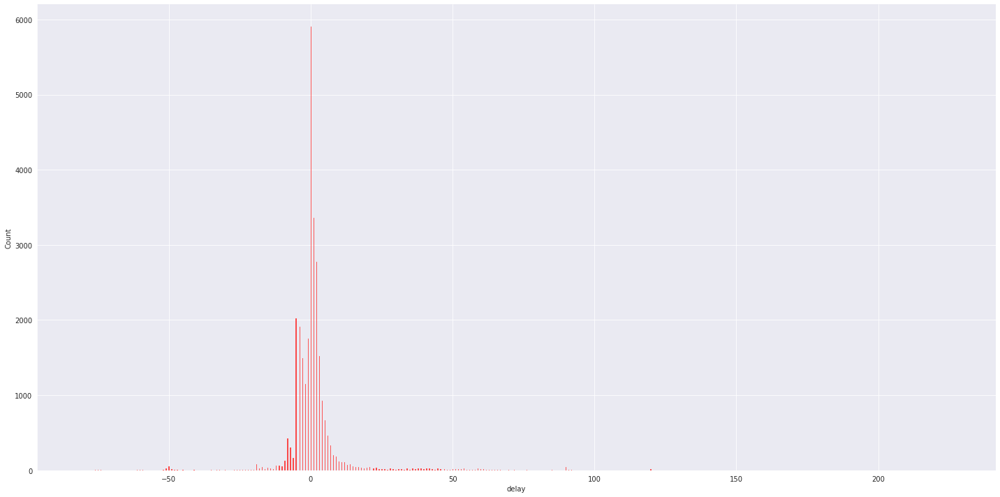

In [182]:
sns.set_style('darkgrid')
sns.displot(y_train, color= 'red', height=10, aspect= 2)

### GRAPH 1 Insights:
1. Very `few outliers` present in our target variable. We can deal if we want to, or not, it `wont matter` much.
2. `Most number of companies` prefer to do their `payment on time`, as can be clearly seen.
3. We can note that our `target` column is `normally distributed`.

<AxesSubplot:xlabel='invoice_currency', ylabel='delay'>

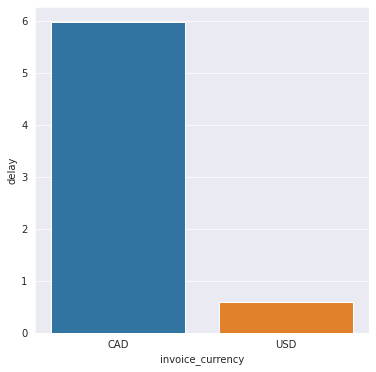

In [183]:
inv = pd.DataFrame(X_train.merge(y_train,on = X_train.index).groupby(['invoice_currency'],as_index=False)['delay'].mean())
plt.figure(figsize=(6,6))
sns.barplot(x='invoice_currency',y='delay', data=inv)

### GRAPH 2 Insights:
1. The `companies` which paid in `CAD` did `more delay` as when compared with companies that paid in `USD`.

<AxesSubplot:xlabel='business_code', ylabel='delay'>

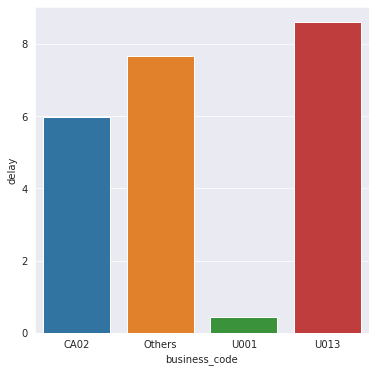

In [184]:
bc = pd.DataFrame(X_train.merge(y_train,on = X_train.index).groupby(['business_code'],as_index=False)['delay'].mean())
plt.figure(figsize=(6,6))
sns.barplot(x='business_code',y='delay', data=bc)

### GRAPH 3 Insights:
1. Seeing the average of delay for total number of companies that had `business_code` as `U001`, paid the due amount `fastest`.   
2. Seeing the average of delay for total number of companies that had `business_code` as `U013`, paid the due amount after `7-8 days`. 
3. Seeing the companies that `didnt` have code `within U001, U013 and CA02` took `long enough time` while paying the amount as well.

<AxesSubplot:xlabel='cust_payment_terms', ylabel='delay'>

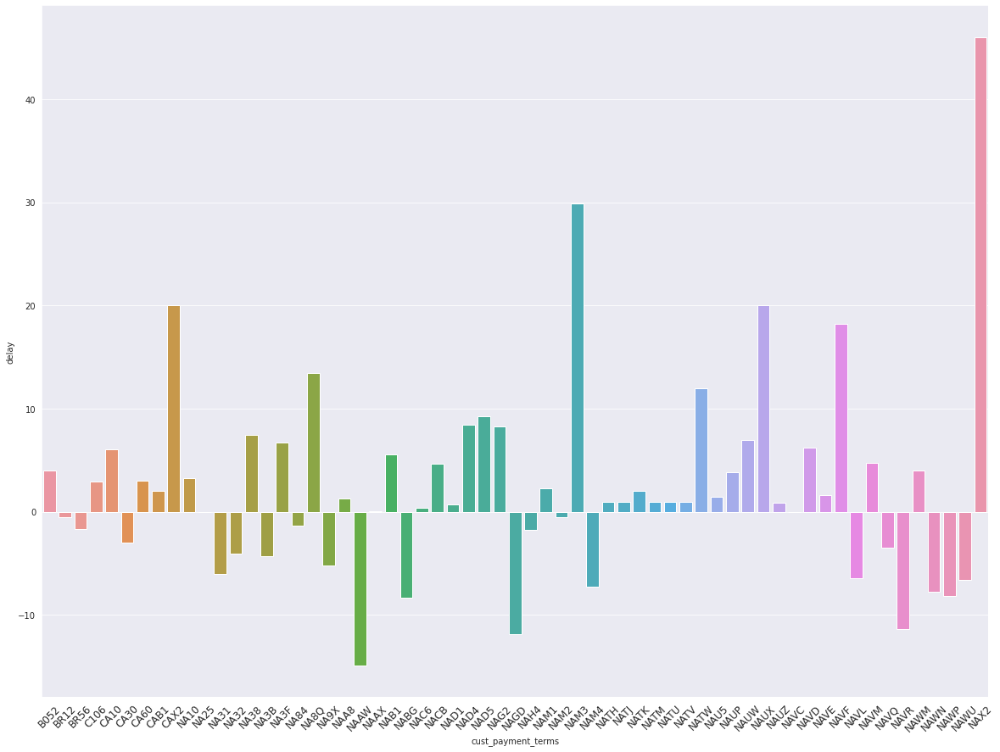

In [185]:
cpt = pd.DataFrame(X_train.merge(y_train,on = X_train.index).groupby(['cust_payment_terms'],as_index=False)['delay'].mean())
plt.figure(figsize=(20,15))
plt.xticks(fontsize=12 ,rotation=45)
sns.barplot(x='cust_payment_terms',y='delay', data=cpt)

### GRAPH 4 Insights:
1. The average of delay for `NAX2` customer payment terms is the `highest`, meaning companies that had customer payment terms paid their amount with the `most delay`.
2. The average of delay for `NAAW` customer payment terms is the `lowest`, meaning companies that had customer payment terms paid their amount the `earliest`.

<AxesSubplot:xlabel='total_open_amount', ylabel='delay'>

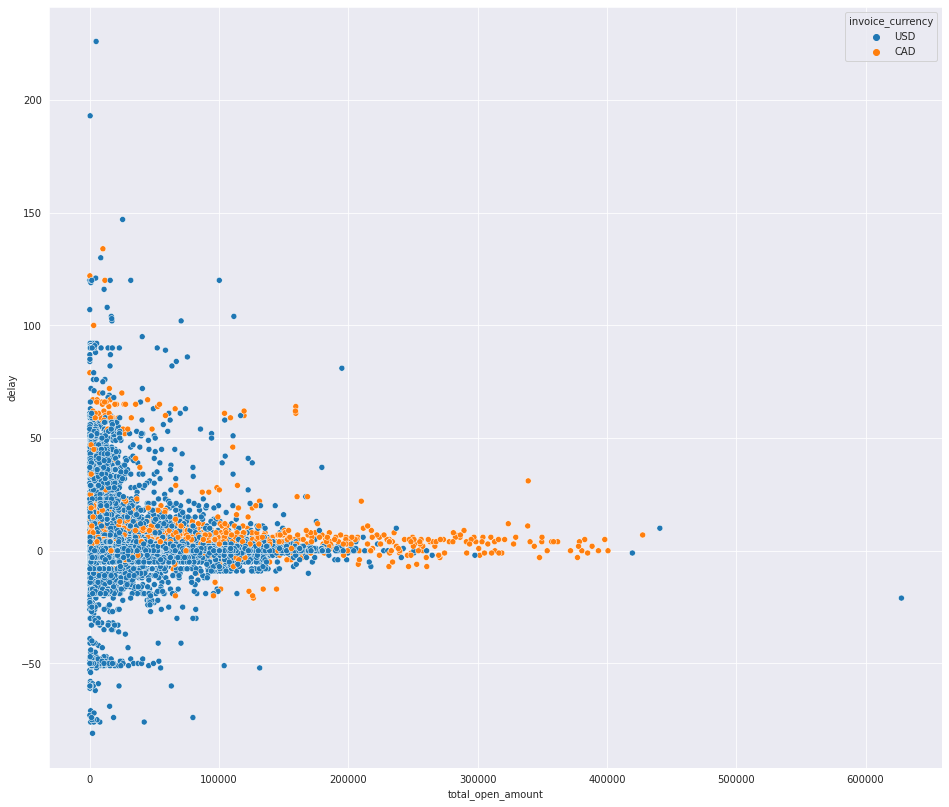

In [186]:
fig, ax = plt.subplots(figsize=(16,14))
sns.scatterplot(data=X_train.merge(y_train,on = X_train.index), y="delay", x="total_open_amount", hue= 'invoice_currency', ax=ax)

### GRAPH 5 Insights:
1. As the `total_open_amount increases`, companies which used to `pay overdue` got serious and `tried to pay on time`.
2. Though, this graph also implies, the companies which used to `pay before due date`, as the `amount increases` tend to be `late` on their payments but still `paid near due date`.
3. Companies that `paid in CAD` currency very `rarely paid before due date`, though still most of them paid between a `due of 0-20 days`. (can confirm below)

In [187]:
filter = X_train.merge(y_train,on = X_train.index).invoice_currency == 'CAD'
X_train.merge(y_train,on = X_train.index).where(filter, inplace=False).dropna()


,key_0,business_code,cust_number,name_customer,clear_date,buisness_year,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms,delay
25,13637.0,CA02,0140104429,COSTCO trust,2019-01-10,2019.0,2018-12-30,2019-01-10,CAD,5565.78,CA10,0.0
75,12907.0,CA02,0140105686,SYSC co,2019-01-17,2019.0,2018-12-31,2019-01-13,CAD,30829.97,CA10,4.0
78,12997.0,CA02,0140104429,COSTCO,2019-01-18,2019.0,2018-12-31,2019-01-13,CAD,80827.93,CA10,5.0
89,16970.0,CA02,0140105686,SYSC corp,2019-01-17,2019.0,2018-12-31,2019-01-13,CAD,31290.89,CA10,4.0
90,43778.0,CA02,0140104423,METRO systems,2019-01-15,2019.0,2018-12-31,2019-01-13,CAD,33820.08,CA10,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...
27972,49952.0,CA02,0140104340,COLABOR corp,2019-10-31,2019.0,2019-10-09,2019-10-20,CAD,1533.52,CA10,11.0
27982,34863.0,CA02,0140106194,ALIMEN,2019-10-21,2019.0,2019-10-09,2019-10-21,CAD,16423.80,CA10,0.0
27985,41069.0,CA02,0140104429,COSTCO in,2019-10-21,2019.0,2019-10-09,2019-10-21,CAD,74434.63,CA10,0.0
27987,41064.0,CA02,0140105686,SYSC us,2019-10-31,2019.0,2019-10-09,2019-10-27,CAD,40017.88,CA10,4.0


<AxesSubplot:xlabel='total_open_amount', ylabel='delay'>

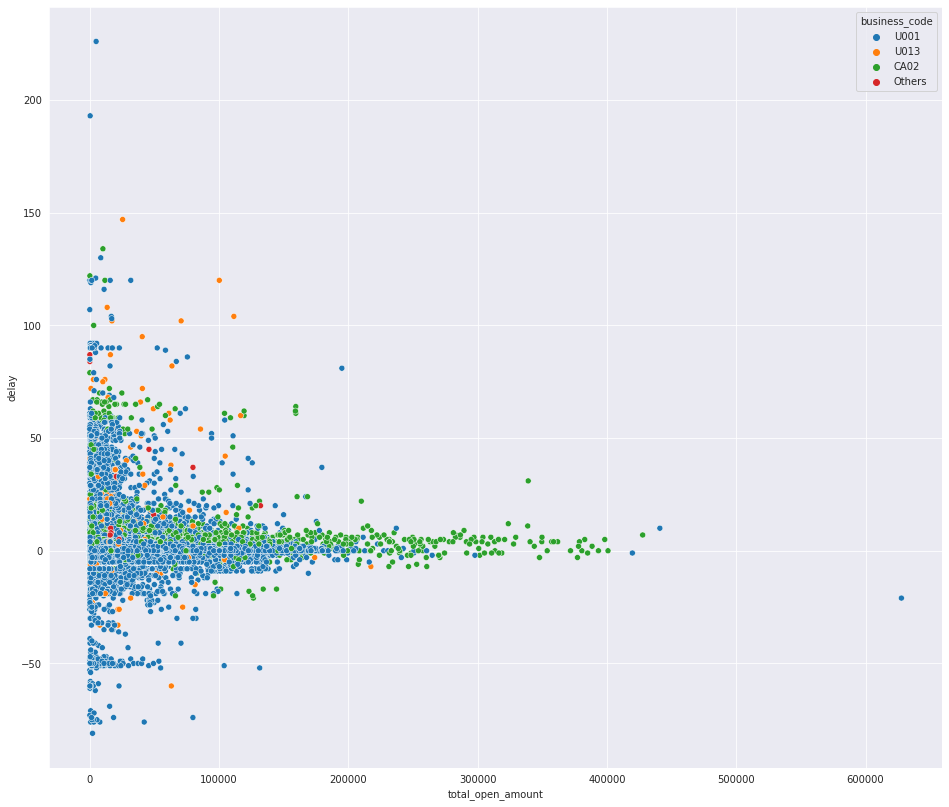

In [188]:
fig, ax = plt.subplots(figsize=(16,14))
sns.scatterplot(data=X_train.merge(y_train,on = X_train.index), x="total_open_amount", y="delay",hue ='business_code',ax=ax)

### GRAPH 6 Insights:
1. Companies that had business code `CA02` never paid before due date, although most of them `paid between 0-50 days of due date`.
2. Companies that had business code OTHER than `U001, U013, CA02 always paid after the due date`.
3. Companies that had business code `U013` paid approximately `75% time after due date`.


<AxesSubplot:xlabel='posting_date', ylabel='delay'>

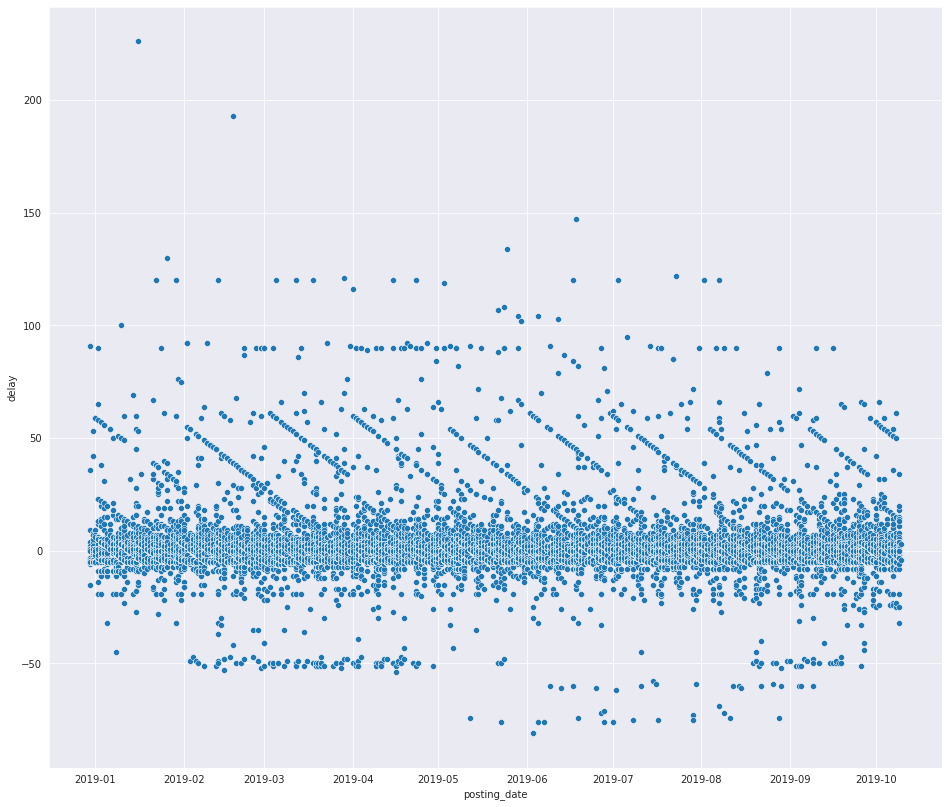

In [189]:
fig, ax = plt.subplots(figsize=(16,14))
sns.scatterplot(data=X_train.merge(y_train,on = X_train.index), y="delay", x="posting_date", ax=ax)

### GRAPH 7 Insights:
1. Companies that had the posting date `before Jan 2019` paid their amount within the `least delay` (spread).
2. As the `date increases` we can see the `spread among delay getting denser and wider`. January had the least spread (except the outliers).
3. Companies that had the `posting date in and after May` tend to pay either `too fast or too late` (excluding the normal behaviour).

<AxesSubplot:xlabel='due_in_date', ylabel='delay'>

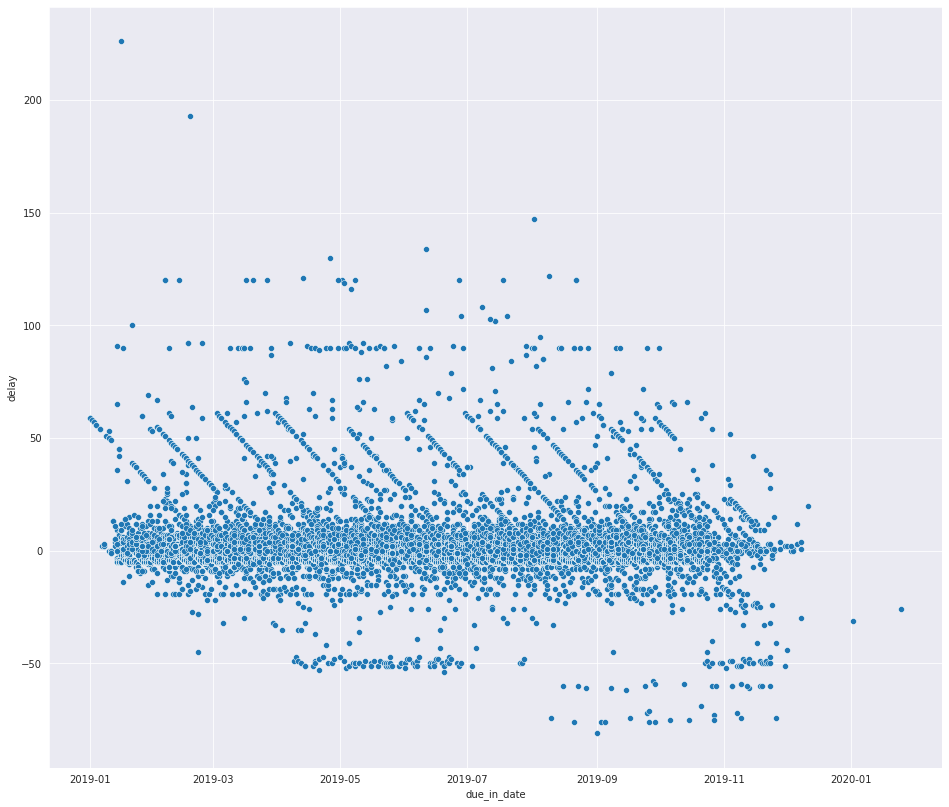

In [190]:
fig, ax = plt.subplots(figsize=(16,14))
sns.scatterplot(data=X_train.merge(y_train,on = X_train.index), y="delay", x="due_in_date", ax=ax)

### GRAPH 8 insights:
1. From data we can say, companies that had `due_in_date in 2020-01` `paid before due date` (though its for only 2 companies, that we can say as outliers, its just data interpretation right now).
2. As the `due date increases`, we can see the `spread of delay increasing as well`.
3. `From April` we can see companies coming that tend to pay `too early` when compared with `actual due_in_date`.
4. `From August` we can see companies coming that tend to pay `even earlier` than those before, about `10%` of them actually paid before `60-80 days` of due date. 


### ***Special Observation:***
Since we sorted our data_train according to posting_date before splitting in train, validation, and local test, we actually made `buisness_year unary (constant)` for our training and validation set (as can be seen below) so its better to remove it as it wont give a trend and wont help in training model. 

In [191]:
print(X_train.buisness_year.nunique(), X_val.buisness_year.nunique(), X_test.buisness_year.nunique())

1 1 2


In [192]:
X_train.drop(labels='buisness_year',axis=1, inplace=True )
X_val.drop(labels='buisness_year',axis=1, inplace=True )
X_test.drop(labels='buisness_year',axis=1, inplace=True )

## FEATURE ENGINEERING

In [193]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27996 entries, 42845 to 46832
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   business_code       27996 non-null  object        
 1   cust_number         27996 non-null  object        
 2   name_customer       27996 non-null  object        
 3   clear_date          27996 non-null  datetime64[ns]
 4   posting_date        27996 non-null  datetime64[ns]
 5   due_in_date         27996 non-null  datetime64[ns]
 6   invoice_currency    27996 non-null  object        
 7   total_open_amount   27996 non-null  float64       
 8   cust_payment_terms  27996 non-null  object        
dtypes: datetime64[ns](3), float64(1), object(5)
memory usage: 2.1+ MB


In [194]:
# engineering on cust_num column
X_train.cust_number.value_counts()

0200769623    5855
0200726979    1034
0200762301     788
0200759878     767
200769623      664
              ... 
140103699        1
200078443        1
100035877        1
100043961        1
0100052167       1
Name: cust_number, Length: 1220, dtype: int64

### ***Why FEATURE HASHING not LABEL ENCODING or ONE HOT ENCODING ??***

So label encoding basically is used for **ordinal categorical** variable, because while training our model, it would give more priority to `x if x > y` where both are intergers. This would further lead to bad prediction, so I avoided using label encoding for **nominal categorical** variable.

Also since our categorical variable had 1300+ unique values, to prevent exploiding of features I decided to use **feature hashing** instead of **label encoding**.

*Need to install category encoders module*                                                                                                            
`pip install category_encoders`

In [195]:
# using feature hashing for training set

from category_encoders.hashing import HashingEncoder
from sklearn.datasets import load_boston
X = X_train
y = np.array(y_train)

he = HashingEncoder(cols=['cust_number','cust_payment_terms'],n_components=8).fit(X, y)
X_train = he.transform(X)
print(X_train.info())


# from sklearn.preprocessing import LabelEncoder
# cust_num = LabelEncoder()
# X_train['Customer_num_enc'] = cust_num.fit_transform(X_train['cust_number'])
# X_val['Customer_num_enc'] = cust_num.fit_transform(X_val['cust_number'])
# X_test['Customer_num_enc'] = cust_num.fit_transform(X_test['cust_number'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27996 entries, 0 to 27995
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   col_0              27996 non-null  int64         
 1   col_1              27996 non-null  int64         
 2   col_2              27996 non-null  int64         
 3   col_3              27996 non-null  int64         
 4   col_4              27996 non-null  int64         
 5   col_5              27996 non-null  int64         
 6   col_6              27996 non-null  int64         
 7   col_7              27996 non-null  int64         
 8   business_code      27996 non-null  object        
 9   name_customer      27996 non-null  object        
 10  clear_date         27996 non-null  datetime64[ns]
 11  posting_date       27996 non-null  datetime64[ns]
 12  due_in_date        27996 non-null  datetime64[ns]
 13  invoice_currency   27996 non-null  object        
 14  total_

In [196]:
#repeating for validation set

X = X_val
y = np.array(y_val)

he = HashingEncoder(cols=['cust_number','cust_payment_terms'],n_components=8).fit(X, y)
X_val = he.transform(X)
print(X_val.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5999 entries, 0 to 5998
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   col_0              5999 non-null   int64         
 1   col_1              5999 non-null   int64         
 2   col_2              5999 non-null   int64         
 3   col_3              5999 non-null   int64         
 4   col_4              5999 non-null   int64         
 5   col_5              5999 non-null   int64         
 6   col_6              5999 non-null   int64         
 7   col_7              5999 non-null   int64         
 8   business_code      5999 non-null   object        
 9   name_customer      5999 non-null   object        
 10  clear_date         5999 non-null   datetime64[ns]
 11  posting_date       5999 non-null   datetime64[ns]
 12  due_in_date        5999 non-null   datetime64[ns]
 13  invoice_currency   5999 non-null   object        
 14  total_op

In [197]:
#repeating for test set

X = X_test
y = np.array(y_test)

he = HashingEncoder(cols=['cust_number','cust_payment_terms'],n_components=8).fit(X, y)
X_test = he.transform(X)
print(X_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   col_0              6000 non-null   int64         
 1   col_1              6000 non-null   int64         
 2   col_2              6000 non-null   int64         
 3   col_3              6000 non-null   int64         
 4   col_4              6000 non-null   int64         
 5   col_5              6000 non-null   int64         
 6   col_6              6000 non-null   int64         
 7   col_7              6000 non-null   int64         
 8   business_code      6000 non-null   object        
 9   name_customer      6000 non-null   object        
 10  clear_date         6000 non-null   datetime64[ns]
 11  posting_date       6000 non-null   datetime64[ns]
 12  due_in_date        6000 non-null   datetime64[ns]
 13  invoice_currency   6000 non-null   object        
 14  total_op

In [198]:
# X_train = X_train.drop(labels='cust_number',axis=1, inplace=False)
# X_val = X_val.drop(labels='cust_number',axis=1, inplace=False)
# X_test = X_test.drop(labels='cust_number',axis=1, inplace=False)

In [199]:
# X_train.groupby('Customer_num_enc')['name_customer'].value_counts()

### ***Special Observation:***
We note that Customer_num_enc gives the same cust_num (old column) for all the name_customer of the same company. For example, looking in the above query, we can see all GEOR customers whether it be GEOR in, GEOR associates, GEOR corp, GEOR trust all fall under the same Customer_num_enc. This makes it easier to find pattern. So we dont need name_customer, thats why I will just drop it.


In [200]:
#X_train['customer'] = X_train['name_customer'].str.split(" ").str[0]
#X_train.customer.nunique()

In [201]:
X_train = X_train.drop(labels='name_customer',axis=1, inplace=False)
X_val = X_val.drop(labels='name_customer',axis=1, inplace=False)
X_test = X_test.drop(labels='name_customer',axis=1, inplace=False)

In [202]:
# engineering business_code (one-hot-encoding)
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    return(res)

In [203]:
X_train = encode_and_bind(X_train,'business_code')
X_val = encode_and_bind(X_val,'business_code')
X_test = encode_and_bind(X_test,'business_code')

In [204]:
# confirming that the encoding worked
X_train[X_train['business_code'] == 'Others']

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,business_code,clear_date,posting_date,due_in_date,invoice_currency,total_open_amount,business_code_CA02,business_code_Others,business_code_U001,business_code_U013
98,1,0,1,0,0,0,0,0,Others,2019-02-12,2018-12-31,2019-02-04,USD,29841.11,0,1,0,0
106,1,0,1,0,0,0,0,0,Others,2019-02-12,2018-12-31,2019-02-04,USD,29841.11,0,1,0,0
142,1,0,0,0,0,0,0,1,Others,2019-02-12,2019-01-01,2019-02-05,USD,13127.32,0,1,0,0
366,1,0,0,1,0,0,0,0,Others,2019-02-06,2019-01-04,2019-02-08,USD,81974.60,0,1,0,0
434,1,0,0,0,0,0,0,1,Others,2019-02-14,2019-01-05,2019-02-09,USD,16008.96,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27542,1,0,0,0,0,0,0,1,Others,2019-11-18,2019-10-04,2019-11-08,USD,16153.21,0,1,0,0
27617,1,0,0,0,0,0,0,1,Others,2019-11-18,2019-10-06,2019-11-10,USD,16402.83,0,1,0,0
27703,1,0,0,0,0,0,0,1,Others,2019-11-18,2019-10-07,2019-11-11,USD,15775.80,0,1,0,0
27758,1,0,0,1,0,0,0,0,Others,2019-11-13,2019-10-07,2019-11-11,USD,18680.50,0,1,0,0


In [205]:
X_train = X_train.drop(labels='business_code',axis=1, inplace=False)
X_val = X_val.drop(labels='business_code',axis=1, inplace=False)
X_test = X_test.drop(labels='business_code',axis=1, inplace=False)

In [206]:
# engineering invoice currency
X_train.invoice_currency = X_train.invoice_currency.map({'USD':0,'CAD':1})
X_val.invoice_currency = X_val.invoice_currency.map({'USD':0,'CAD':1})
X_test.invoice_currency = X_test.invoice_currency.map({'USD':0,'CAD':1})

In [207]:
# Since clear date has to be predicted in the final test dataset, i am not going to analyse patterns from clear_date, so I will drop it.
X_train = X_train.drop(labels='clear_date',axis=1, inplace=False)
X_val = X_val.drop(labels='clear_date',axis=1, inplace=False)
X_test = X_test.drop(labels='clear_date',axis=1, inplace=False)

In [208]:
# # engineering cust_payment_terms
# X_train.cust_payment_terms.nunique()

In [209]:
# enc = LabelEncoder()
# X_train['cpayment_terms'] = enc.fit_transform(X_train['cust_payment_terms'])
# X_val['cpayment_terms'] = enc.fit_transform(X_val['cust_payment_terms'])
# X_test['cpayment_terms'] = enc.fit_transform(X_test['cust_payment_terms'])

# from category_encoders.hashing import HashingEncoder
# from sklearn.datasets import load_boston
# X = X_train
# y = np.array(y_train)

# he = HashingEncoder(cols=['cust_payment_terms'],n_components=4).fit(X, y)
# X_train = he.transform(X)
# print(X_train.info())

 

In [210]:
# from category_encoders.hashing import HashingEncoder
# from sklearn.datasets import load_boston
# X = X_val
# y = np.array(y_val)

# he = HashingEncoder(cols=['cust_payment_terms'],n_components=4).fit(X, y)
# X_val = he.transform(X)
# print(X_val.info())

In [211]:
# from category_encoders.hashing import HashingEncoder
# from sklearn.datasets import load_boston
# X = X_test
# y = np.array(y_test)

# he = HashingEncoder(cols=['cust_payment_terms'],n_components=4).fit(X, y)
# X_test = he.transform(X)
# print(X_test.info())

In [212]:
# X_train = X_train.drop(labels='cust_payment_terms',axis=1, inplace=False)
# X_val = X_val.drop(labels='cust_payment_terms',axis=1, inplace=False)
# X_test = X_test.drop(labels='cust_payment_terms',axis=1, inplace=False)

In [213]:
# extracting features out of datetime columns

# engineering on posting_date
# basis for features
X_train['pd_day_of_month'] = X_train['posting_date'].dt.day
X_train['pd_dayofweekname'] = X_train['posting_date'].dt.dayofweek

# features of posting_date
X_train['pd_is_weekend'] = np.where(X_train['pd_dayofweekname'].isin([5,6]),1,0)
X_train['pd_is_monthend'] = np.where(X_train['pd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_train['pd_month_of_year'] = X_train['posting_date'].dt.month

# dropping extra columns
X_train.drop(labels='pd_day_of_month',axis=1,inplace=True)
X_train.drop(labels='pd_dayofweekname',axis=1,inplace=True)

In [214]:
# repeating same for validation set
X_val['pd_day_of_month'] = X_val['posting_date'].dt.day
X_val['pd_dayofweekname'] = X_val['posting_date'].dt.dayofweek

X_val['pd_is_weekend'] = np.where(X_val['pd_dayofweekname'].isin([5,6]),1,0)
X_val['pd_is_monthend'] = np.where(X_val['pd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_val['pd_month_of_year'] = X_val['posting_date'].dt.month

X_val.drop(labels='pd_day_of_month',axis=1,inplace=True)
X_val.drop(labels='pd_dayofweekname',axis=1,inplace=True)

In [215]:
# repeating same for test set
X_test['pd_day_of_month'] = X_test['posting_date'].dt.day
X_test['pd_dayofweekname'] = X_test['posting_date'].dt.dayofweek

X_test['pd_is_weekend'] = np.where(X_test['pd_dayofweekname'].isin([5,6]),1,0)
X_test['pd_is_monthend'] = np.where(X_test['pd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_test['pd_month_of_year'] = X_test['posting_date'].dt.month

X_test.drop(labels='pd_day_of_month',axis=1,inplace=True)
X_test.drop(labels='pd_dayofweekname',axis=1,inplace=True)

In [216]:
# dropping posting_date from all three sets
X_train.drop(labels='posting_date',axis=1,inplace=True)
X_val.drop(labels='posting_date',axis=1,inplace=True)
X_test.drop(labels='posting_date',axis=1,inplace=True)

In [217]:
# engineering on due_in_date
# basis for features
X_train['dd_day_of_month'] = X_train['due_in_date'].dt.day
X_train['dd_dayofweekname'] = X_train['due_in_date'].dt.dayofweek

# features of posting_date
X_train['dd_is_weekend'] = np.where(X_train['dd_dayofweekname'].isin([5,6]),1,0)
X_train['dd_is_monthend'] = np.where(X_train['dd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_train['dd_month_of_year'] = X_train['due_in_date'].dt.month

# dropping extra columns
X_train.drop(labels='dd_day_of_month',axis=1,inplace=True)
X_train.drop(labels='dd_dayofweekname',axis=1,inplace=True)

In [218]:
# repeating the same for validation set
X_val['dd_day_of_month'] = X_val['due_in_date'].dt.day
X_val['dd_dayofweekname'] = X_val['due_in_date'].dt.dayofweek

X_val['dd_is_weekend'] = np.where(X_val['dd_dayofweekname'].isin([5,6]),1,0)
X_val['dd_is_monthend'] = np.where(X_val['dd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_val['dd_month_of_year'] = X_val['due_in_date'].dt.month

X_val.drop(labels='dd_day_of_month',axis=1,inplace=True)
X_val.drop(labels='dd_dayofweekname',axis=1,inplace=True)

In [219]:
# repeating the same for test set
X_test['dd_day_of_month'] = X_test['due_in_date'].dt.day
X_test['dd_dayofweekname'] = X_test['due_in_date'].dt.dayofweek

X_test['dd_is_weekend'] = np.where(X_test['dd_dayofweekname'].isin([5,6]),1,0)
X_test['dd_is_monthend'] = np.where(X_test['dd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_test['dd_month_of_year'] = X_test['due_in_date'].dt.month

X_test.drop(labels='dd_day_of_month',axis=1,inplace=True)
X_test.drop(labels='dd_dayofweekname',axis=1,inplace=True)

In [220]:
# dropping due_in_date from all three sets
X_train.drop(labels='due_in_date',axis=1,inplace=True)
X_val.drop(labels='due_in_date',axis=1,inplace=True)
X_test.drop(labels='due_in_date',axis=1,inplace=True)

In [221]:
X_train

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,invoice_currency,total_open_amount,business_code_CA02,business_code_Others,business_code_U001,business_code_U013,pd_is_weekend,pd_is_monthend,pd_month_of_year,dd_is_weekend,dd_is_monthend,dd_month_of_year
0,0,0,1,0,0,1,0,0,0,16224.21,0,0,1,0,1,1,12,0,0,1
1,0,0,1,0,0,1,0,0,0,15950.50,0,0,1,0,1,1,12,0,0,1
2,0,0,1,0,0,1,0,0,0,13065.20,0,0,1,0,1,1,12,0,0,1
3,0,0,0,1,0,1,0,0,0,53.25,0,0,1,0,1,1,12,0,0,1
4,0,0,0,0,0,2,0,0,0,39713.18,0,0,1,0,1,1,12,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27991,1,0,0,0,0,0,1,0,1,23156.90,1,0,0,0,0,0,10,0,0,11
27992,0,0,1,0,0,1,0,0,0,33273.53,0,0,1,0,0,0,10,0,0,10
27993,0,2,0,0,0,0,0,0,0,21519.64,0,0,1,0,0,0,10,0,1,10
27994,1,0,0,0,0,1,0,0,0,41720.78,0,0,1,0,0,0,10,0,1,10


# MILESTONE 3: BUILD PREDICTIVE MODEL

## FEATURE SCALING AND SELECTION

In [222]:
# Standardizing total_open_amount
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

In [223]:
# Scaling values of train
features = X_train.total_open_amount.values.reshape(-1,1)
sc = StandardScaler()
x_scaler = sc.fit_transform(features)
scaled_features_df = pd.DataFrame(x_scaler)
scaled_features_df.rename(columns = {0:'amount'}, inplace = True)
X_train.reset_index(drop=True,inplace=True)
X_train['amount'] = scaled_features_df['amount']

In [224]:
# Scaling values of val
features = X_val.total_open_amount.values.reshape(-1,1)
sc = StandardScaler()
x_scaler = sc.fit_transform(features)
scaled_features_df = pd.DataFrame(x_scaler)
scaled_features_df.rename(columns = {0:'amount'}, inplace = True)
X_val.reset_index(drop=True,inplace=True)
X_val['amount'] = scaled_features_df['amount']

In [225]:
# Scaling values of test
features = X_test.total_open_amount.values.reshape(-1,1)
sc = StandardScaler()
x_scaler = sc.fit_transform(features)
scaled_features_df = pd.DataFrame(x_scaler)
scaled_features_df.rename(columns = {0:'amount'}, inplace = True)
X_test.reset_index(drop=True,inplace=True)
X_test['amount'] = scaled_features_df['amount']

In [226]:
# dropping due_in_date from all three sets
X_train.drop(labels='total_open_amount',axis=1,inplace=True)
X_val.drop(labels='total_open_amount',axis=1,inplace=True)
X_test.drop(labels='total_open_amount',axis=1,inplace=True)

In [227]:
X_train[X_train['amount']> 10]

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,invoice_currency,business_code_CA02,business_code_Others,business_code_U001,business_code_U013,pd_is_weekend,pd_is_monthend,pd_month_of_year,dd_is_weekend,dd_is_monthend,dd_month_of_year,amount
22981,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,8,0,0,9,14.925174
26960,0,0,0,0,0,2,0,0,0,0,0,1,0,1,1,9,1,0,10,10.244279


<AxesSubplot:title={'center':'Pearson Correlation of Features'}>

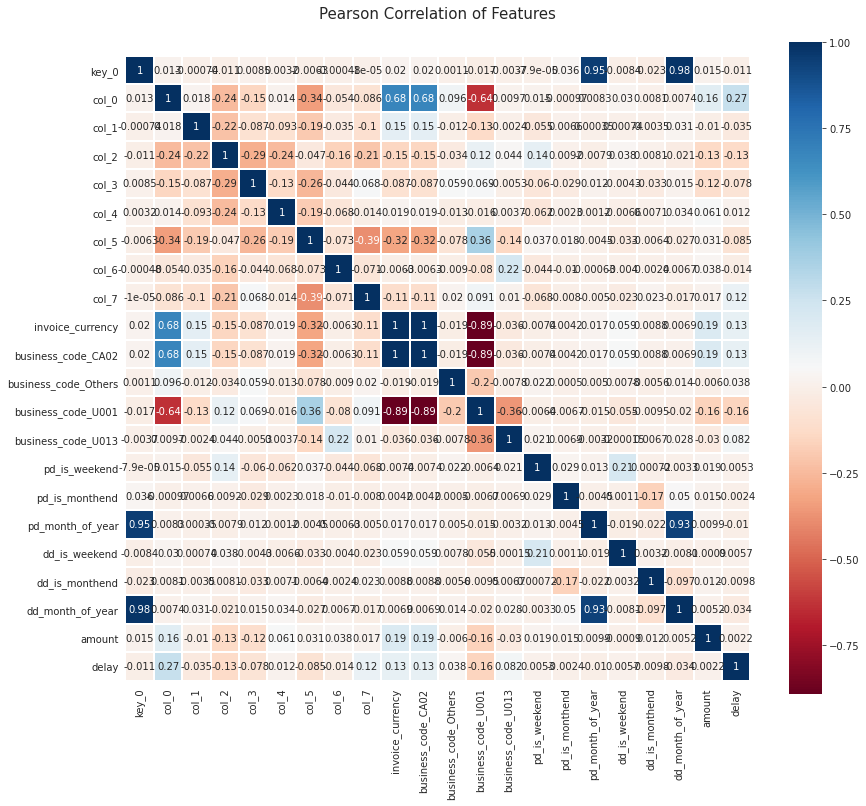

In [228]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(X_train.merge(y_train, on = X_train.index ).corr(),linewidths=0.2,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

### Observation 6:

1. `dd_month_of_year` and `pd_month_of_year` are `highly correlated`, they wont help in model training, its better to remove one of them.
2. `invoice_currency` to `business_code_CA02` (+) and to `business_code_U001` (-)  are `highly correlated`, they wont help in model training, its better to remove one of them.
3. `business_code_CA02` and `business_code_U001` are `highly inter correlated` as well, would have to remove one of them/

In [229]:
# dropping pd_month_of_year from all three sets
X_train.drop(labels='pd_month_of_year',axis=1,inplace=True)
X_val.drop(labels='pd_month_of_year',axis=1,inplace=True)
X_test.drop(labels='pd_month_of_year',axis=1,inplace=True)

In [230]:
# dropping invoice_currency from all three sets
X_train.drop(labels='invoice_currency',axis=1,inplace=True)
X_val.drop(labels='invoice_currency',axis=1,inplace=True)
X_test.drop(labels='invoice_currency',axis=1,inplace=True)

In [231]:
# dropping business_code_U001 from all three sets
X_train.drop(labels='business_code_U001',axis=1,inplace=True)
X_val.drop(labels='business_code_U001',axis=1,inplace=True)
X_test.drop(labels='business_code_U001',axis=1,inplace=True)

<AxesSubplot:title={'center':'Pearson Correlation of Features'}>

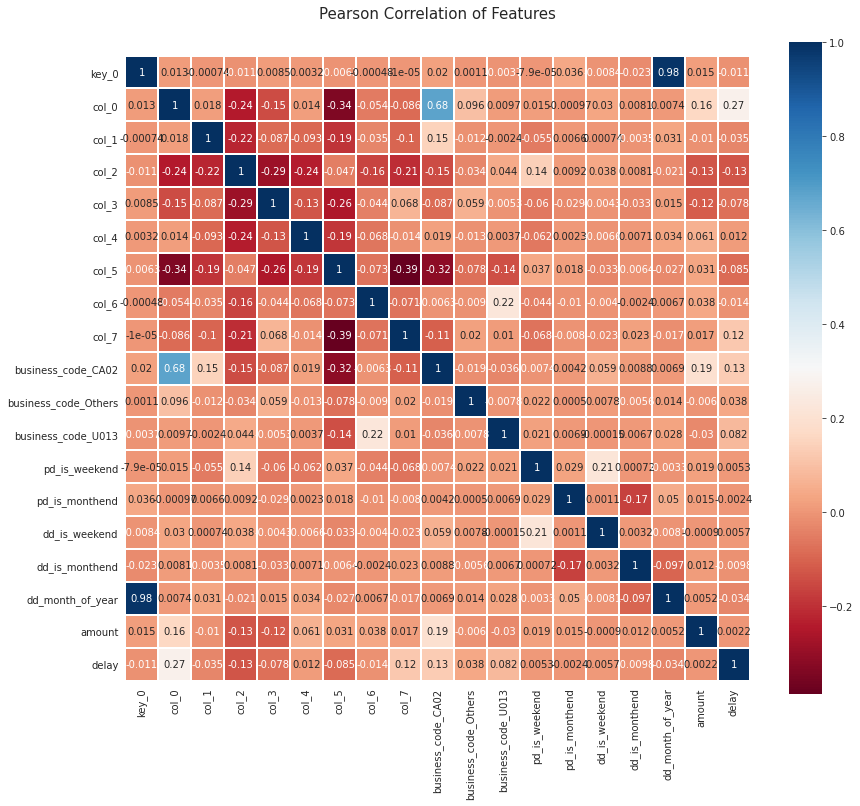

In [232]:
# updated heatmap:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(X_train.merge(y_train, on = X_train.index ).corr(),linewidths=0.2,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [233]:
X_train.amount.describe()

count    2.799600e+04
mean     8.933814e-17
std      1.000018e+00
min     -8.031082e-01
25%     -6.904344e-01
50%     -3.750544e-01
75%      3.497714e-01
max      1.492517e+01
Name: amount, dtype: float64

In [234]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(0.8)
sel.fit(X_train)

VarianceThreshold(threshold=0.8)

In [235]:
sel.variances_

# no variance was below 0.8 (meaning none of the variables were quasi constant, below 92% similarity)

array([1.81319898e-01, 1.16387404e-01, 2.85237225e-01, 1.80163558e-01,
       1.16584333e-01, 3.38781149e-01, 5.54506787e-02, 1.59903653e-01,
       7.37895761e-02, 4.16170300e-03, 1.41530077e-02, 1.45687336e-01,
       1.66207163e-01, 2.01223962e-01, 1.58143113e-01, 7.22062217e+00,
       1.00000000e+00])

## MODELLING

### Create a base model:

In [236]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

base_model = LinearRegression()
base_model.fit(X_train, y_train)

LinearRegression()

In [237]:
y_predict = base_model.predict(X_val)
print('RMS Value : {}'.format(mean_squared_error(y_val, y_predict, squared=False)))
print('R2_score : {}'.format(abs(r2_score(y_val,y_predict))))

RMS Value : 6.2879725745405635
R2_score : 0.1220757037103517


In [238]:
#import statsmodels.api as sm
#logm1 = sm.OLS(y_train.values,(sm.add_constant(X_train.values)), family = sm.families.Binomial())
#logm1.fit().summary()

### Tree based model:

In [239]:
data_train

,business_code,cust_number,name_customer,clear_date,buisness_year,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms,delay
42845,U001,0200769623,WAL-MAR systems,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,16224.21,NAH4,-5
10254,U001,0200769623,WAL-MAR trust,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,15950.5,NAH4,-5
30791,U001,0200769623,WAL-MAR us,2019-01-11,2019.0,2018-12-30,2019-01-14,USD,13065.2,NAH4,-3
26432,U001,0200726979,BJ'S corporation,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,53.25,NAA8,1
28988,U001,0200744019,TARG systems,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,39713.18,NAA8,4
...,...,...,...,...,...,...,...,...,...,...,...
27470,U001,0200739044,PERFOR corporation,2020-03-16,2020.0,2020-02-27,2020-03-13,USD,25143.02,NAA8,3
7942,U001,0200777735,NASH trust,2020-03-11,2020.0,2020-02-27,2020-03-13,USD,141239.93,NAA8,-2
22960,U001,0200956366,RICH corp,2020-03-06,2020.0,2020-02-27,2020-03-13,USD,51919.56,NAA8,-7
33504,U001,0200357714,US in,2020-03-13,2020.0,2020-02-27,2020-03-13,USD,28374.59,NAA8,0


In [240]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state=0 , max_depth=1)

In [241]:
regressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=1, random_state=0)

In [242]:
y_predict2 = regressor.predict(X_val)
print('RMS value: {}'.format(mean_squared_error(y_val, y_predict2, squared=False)))
print('R2_score: {}'.format(abs(r2_score(y_val,y_predict2))))


RMS value: 6.530072990396967
R2_score: 0.05317032293581381


### Observation 8:
`Linear Regression Model` is working better than my `tree based model` (probably because I scaled the total_open_amount). Both have considerably `poor r2 score`, but tree model having the worst.

# PRICE PREDICTION 

In [243]:
y_predict_test = base_model.predict(X_test)
print('RMS value: {}'.format(mean_squared_error(y_test, y_predict_test, squared=False)))
print('R2_score: {}'.format(abs(r2_score(y_test,y_predict_test))))

RMS value: 9.654800308841736
R2_score: 0.12240157451303157


### Working with the lost data

### Preprocessing

In [244]:
data_test['clear_date']= pd.to_datetime(data_test['clear_date'])
data_test['due_in_date'] = pd.to_datetime(data_test['due_in_date'], format='%Y%m%d')
data_test['posting_date'] = pd.to_datetime(data_test['posting_date'], format='%Y-%m-%d')

# make target variable that will be used to predict clear_date
data_test['delay'] = (data_test['clear_date'] - data_test['due_in_date']).dt.days

In [245]:
X_data_test = data_test.drop(['clear_date'],axis=1)
#also dropping clear_date from data_test itself
data_test.drop(['clear_date'],axis=1,inplace=True)

In [246]:
# making data_test similar to data_train after preprocessing
X_data_test.drop(labels=['invoice_id','doc_id','document_create_date.1','document_create_date','baseline_create_date','buisness_year','document type','area_business','posting_id','isOpen'],axis=1,inplace=True)
X_data_test['business_code'] = np.where(X_data_test.business_code.isin(['U002', 'U005', 'U007']),'Others',X_data_test['business_code'])

In [247]:
# sort according to posting_date
data_test.sort_values(['posting_date'],inplace=True)
X_data_test.sort_values(['posting_date'],inplace=True)

### Feature engineering/selection/scaling

In [248]:
X_data_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 16012 to 21426
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   business_code       10000 non-null  object        
 1   cust_number         10000 non-null  object        
 2   name_customer       10000 non-null  object        
 3   posting_date        10000 non-null  datetime64[ns]
 4   due_in_date         10000 non-null  datetime64[ns]
 5   invoice_currency    10000 non-null  object        
 6   total_open_amount   10000 non-null  float64       
 7   cust_payment_terms  10000 non-null  object        
 8   delay               0 non-null      float64       
dtypes: datetime64[ns](2), float64(2), object(5)
memory usage: 781.2+ KB


In [249]:
X_data_test

,business_code,cust_number,name_customer,posting_date,due_in_date,invoice_currency,total_open_amount,cust_payment_terms,delay
16012,U001,0200793513,KROGER,2020-02-27,2020-03-13,USD,86573.22,NAA8,NaN
678,U001,0200780383,MEIJ llc,2020-02-27,2020-03-13,USD,54201.97,NAA8,NaN
16472,U001,0200718130,SYSCO F,2020-02-27,2020-03-30,USD,27319.33,NA32,NaN
16470,U001,0200769623,WAL-MAR corporation,2020-02-27,2020-03-13,USD,43708.74,NAH4,NaN
9772,U001,0200712187,SPAR llc,2020-02-27,2020-03-13,USD,608.26,NAA8,NaN
...,...,...,...,...,...,...,...,...,...
38512,U001,0200457993,SHAM co,2020-05-15,2020-05-30,USD,19798.67,NAA8,NaN
41212,U001,200875680,MINERS,2020-05-18,2020-06-02,USD,119248.83,NAA8,NaN
15291,U001,0200756072,REINHA foundation,2020-05-21,2020-06-20,USD,16.76,NAD5,NaN
44467,U001,0200756072,REINHA corporation,2020-05-21,2020-06-20,USD,20.95,NAD5,NaN


In [250]:
# feature hashing cust_number and cust_payment_terms
X = X_data_test.iloc[:, :-1]
y = X_data_test.iloc[:, -1]

he = HashingEncoder(cols=['cust_number','cust_payment_terms'],n_components=8).fit(X, y)
X_data_test = he.transform(X)
print(X_data_test.info())
X_data_test.drop(labels=['name_customer'],axis=1,inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   col_0              10000 non-null  int64         
 1   col_1              10000 non-null  int64         
 2   col_2              10000 non-null  int64         
 3   col_3              10000 non-null  int64         
 4   col_4              10000 non-null  int64         
 5   col_5              10000 non-null  int64         
 6   col_6              10000 non-null  int64         
 7   col_7              10000 non-null  int64         
 8   business_code      10000 non-null  object        
 9   name_customer      10000 non-null  object        
 10  posting_date       10000 non-null  datetime64[ns]
 11  due_in_date        10000 non-null  datetime64[ns]
 12  invoice_currency   10000 non-null  object        
 13  total_open_amount  10000 non-null  float64       
dtypes: date

In [251]:
# engineering business_code (one-hot-encoding)
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    return(res)

X_data_test = encode_and_bind(X_data_test,'business_code')
X_data_test.drop(labels=['business_code'],axis=1,inplace=True)

In [252]:
# extracting features out of datetime columns

# engineering on posting_date
# basis for features
X_data_test['pd_day_of_month'] = X_data_test['posting_date'].dt.day
X_data_test['pd_dayofweekname'] = X_data_test['posting_date'].dt.dayofweek

# features of posting_date
X_data_test['pd_is_weekend'] = np.where(X_data_test['pd_dayofweekname'].isin([5,6]),1,0)
X_data_test['pd_is_monthend'] = np.where(X_data_test['pd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_data_test['pd_month_of_year'] = X_data_test['posting_date'].dt.month

# dropping extra columns
X_data_test.drop(labels='pd_day_of_month',axis=1,inplace=True)
X_data_test.drop(labels='pd_dayofweekname',axis=1,inplace=True)

# dropping in accordance with X_train
X_data_test.drop(labels=['pd_month_of_year','posting_date'],axis=1,inplace=True)

In [253]:
# engineering on due_in_date
# basis for features
X_data_test['dd_day_of_month'] = X_data_test['due_in_date'].dt.day
X_data_test['dd_dayofweekname'] = X_data_test['due_in_date'].dt.dayofweek

# features of due_in_date
X_data_test['dd_is_weekend'] = np.where(X_data_test['dd_dayofweekname'].isin([5,6]),1,0)
X_data_test['dd_is_monthend'] = np.where(X_data_test['dd_day_of_month'].isin([25,26,27,28,29,30,31]),1,0)
X_data_test['dd_month_of_year'] = X_data_test['due_in_date'].dt.month

# dropping extra columns
X_data_test.drop(labels='dd_day_of_month',axis=1,inplace=True)
X_data_test.drop(labels='dd_dayofweekname',axis=1,inplace=True)

# dropping in accordance with X_train
X_data_test.drop(labels=['due_in_date','invoice_currency','business_code_U001'],axis=1,inplace=True)

In [254]:
# feature scaling total_open_amount
features = X_data_test.total_open_amount.values.reshape(-1,1)
sc = StandardScaler()
x_scaler = sc.fit_transform(features)
scaled_features_df = pd.DataFrame(x_scaler)
scaled_features_df.rename(columns = {0:'amount'}, inplace = True)
X_data_test.reset_index(drop=True,inplace=True)
X_data_test['amount'] = scaled_features_df['amount']
X_data_test.drop(labels='total_open_amount',axis=1,inplace=True)

In [255]:
# comparing X_train and X_data_test

In [256]:
X_train.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,business_code_CA02,business_code_Others,business_code_U013,pd_is_weekend,pd_is_monthend,dd_is_weekend,dd_is_monthend,dd_month_of_year,amount
0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,-0.396665
1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,-0.403523
2,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,-0.475814
3,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,1,-0.801827
4,0,0,0,0,0,2,0,0,0,0,0,1,1,0,0,1,0.191850


In [257]:
X_data_test.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,business_code_CA02,business_code_Others,business_code_U013,pd_is_weekend,pd_is_monthend,dd_is_weekend,dd_is_monthend,dd_month_of_year,amount
0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,3,1.444904
1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,3,0.577299
2,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,3,-0.143203
3,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,3,0.296062
4,0,0,0,0,0,2,0,0,0,0,0,0,1,0,0,3,-0.859106


### Finally Predicting Delay

In [258]:
final_delay = base_model.predict(X_data_test)
final_delay = pd.Series(final_delay,name= 'delay')

In [259]:
# since delay should be numerical and not in decimal, rounding off final_delay
final_delay = final_delay.round()

In [260]:
final_delay

0      -2.0
1      -1.0
2      -3.0
3      -1.0
4       2.0
       ... 
9995    4.0
9996   -2.0
9997    5.0
9998    5.0
9999    5.0
Name: delay, Length: 10000, dtype: float64

In [261]:
data_test.drop('delay',axis=1,inplace=True)
Final = data_test.merge(final_delay , on = X_data_test.index )

In [262]:
from datetime import timedelta
Final['clear_date'] = Final['due_in_date'] + pd.to_timedelta(Final['delay'], unit='d')

In [265]:
d = {range(-30,0): '< 0', range(0,15): '0-15', range(15,30) : '15-30'}
Final['Buckets'] = Final['delay'].apply(lambda x: next((v for k, v in d.items() if x in k), 0))

In [266]:
Final[['due_in_date','delay','clear_date','Buckets']]

,due_in_date,delay,clear_date,Buckets
0,2020-03-13,-2.0,2020-03-11,< 0
1,2020-03-13,-1.0,2020-03-12,< 0
2,2020-03-30,-3.0,2020-03-27,< 0
3,2020-03-13,-1.0,2020-03-12,< 0
4,2020-03-13,2.0,2020-03-15,0-15
...,...,...,...,...
9995,2020-05-30,4.0,2020-06-03,0-15
9996,2020-06-02,-2.0,2020-05-31,< 0
9997,2020-06-20,5.0,2020-06-25,0-15
9998,2020-06-20,5.0,2020-06-25,0-15


In [267]:
Final.drop(['delay','key_0'],axis=1,inplace=True)

# Good Game

In [268]:
Final

,business_code,cust_number,name_customer,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,clear_date,Buckets
0,U001,0200793513,KROGER,2020.0,1.930571e+09,2020-02-27,20200226,20200227,2020-03-13,USD,RV,1.0,NaN,86573.22,20200227.0,NAA8,1.930571e+09,1,2020-03-11,< 0
1,U001,0200780383,MEIJ llc,2020.0,1.930575e+09,2020-02-27,20200227,20200227,2020-03-13,USD,RV,1.0,NaN,54201.97,20200227.0,NAA8,1.930575e+09,1,2020-03-12,< 0
2,U001,0200718130,SYSCO F,2020.0,1.930570e+09,2020-02-27,20200225,20200227,2020-03-30,USD,RV,1.0,NaN,27319.33,20200227.0,NA32,1.930570e+09,1,2020-03-27,< 0
3,U001,0200769623,WAL-MAR corporation,2020.0,1.930570e+09,2020-02-27,20200225,20200227,2020-03-13,USD,RV,1.0,NaN,43708.74,20200227.0,NAH4,1.930570e+09,1,2020-03-12,< 0
4,U001,0200712187,SPAR llc,2020.0,1.930578e+09,2020-02-27,20200227,20200227,2020-03-13,USD,RV,1.0,NaN,608.26,20200227.0,NAA8,1.930578e+09,1,2020-03-15,0-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,U001,0200457993,SHAM co,2020.0,1.930902e+09,2020-05-15,20200514,20200515,2020-05-30,USD,RV,1.0,NaN,19798.67,20200515.0,NAA8,1.930902e+09,1,2020-06-03,0-15
9996,U001,200875680,MINERS,2020.0,1.930911e+09,2020-05-18,20200516,20200518,2020-06-02,USD,RV,1.0,NaN,119248.83,20200518.0,NAA8,1.930911e+09,1,2020-05-31,< 0
9997,U001,0200756072,REINHA foundation,2020.0,1.930927e+09,2020-05-21,20200521,20200521,2020-06-20,USD,RV,1.0,NaN,16.76,20200521.0,NAD5,1.930927e+09,1,2020-06-25,0-15
9998,U001,0200756072,REINHA corporation,2020.0,1.930926e+09,2020-05-21,20200521,20200521,2020-06-20,USD,RV,1.0,NaN,20.95,20200521.0,NAD5,1.930926e+09,1,2020-06-25,0-15
